In [ ]:
import cv2
import numpy as np

In [ ]:
from google.colab.patches import cv2_imshow


In [ ]:
def stackImages(imgArray, scale):
  rows=len(imgArray)
  cols=len(imgArray[0])

  rowsAvailable=isinstance(imgArray[0],list)
  width=imgArray[0][0].shape[1]
  height=imgArray[0][0].shape[0]
  if rowsAvailable:
    for x in range(0,rows):
      for y in range(0,cols):
        imgArray[x][y]=cv2.resize(imgArray[x][y],(0,0),None,scale,scale)
        if len(imgArray[x][y].shape)==2:imageArray[x][y]=cv2.cvtColor(imgArray[x][y],cv2.COLOR_GRAY2BGR)
    imageBlank=np.zeros((height,width,3),np.uint8)
    hor=[imageBlank]*rows
    hor_con=[imageBlank]*rows
    for x in range(0,rows):
      hor[x]=np.hstack(imageArray[x])
    ver=np.vstack(hor)
  else:
    for x in range(0,rows):
      if imgArray[x].shape[:2]==imgArray[0].shape[:2]:
        imgArray[x]=cv2.resize(imgArray[x],(0,0),None,scale,scale)
      else:
        imgArray[x]=cv2.resize(imgArray[x],(imgArray[0].shape[1],imgArray[0].shape[0]),None,scale,scale)

      if len(imgArray[x].shape)==2:imgArray[x]=cv2.cvtColor(imgArray[x],cv2.COLOR_GRAY2BGR)
    hor=np.hstack(imgArray)
    ver=hor
  return ver





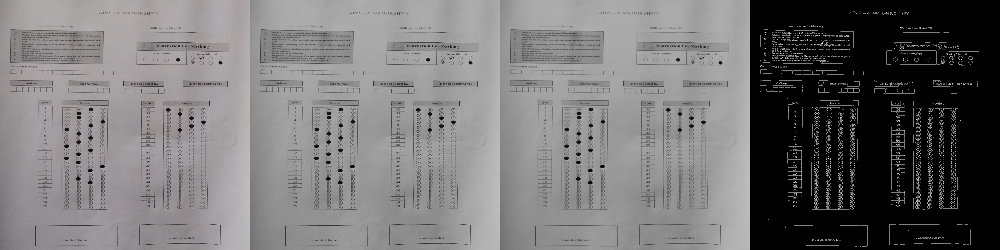

-1

In [ ]:
path="/content/IMG_20231023_132244.jpg"
widthImg=2000
heightImg=2000


img=cv2.imread(path)

#preprocessing

img=cv2.resize(img,(widthImg,heightImg))
imgGray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
imgBlur=cv2.GaussianBlur(imgGray,(5,5),1)
imgCanny=cv2.Canny(imgBlur,20,50)


imageArray=([img,imgGray,imgBlur,imgCanny])

imgStacked=stackImages(imageArray,0.5)

cv2_imshow(imgStacked)
cv2.waitKey(0)

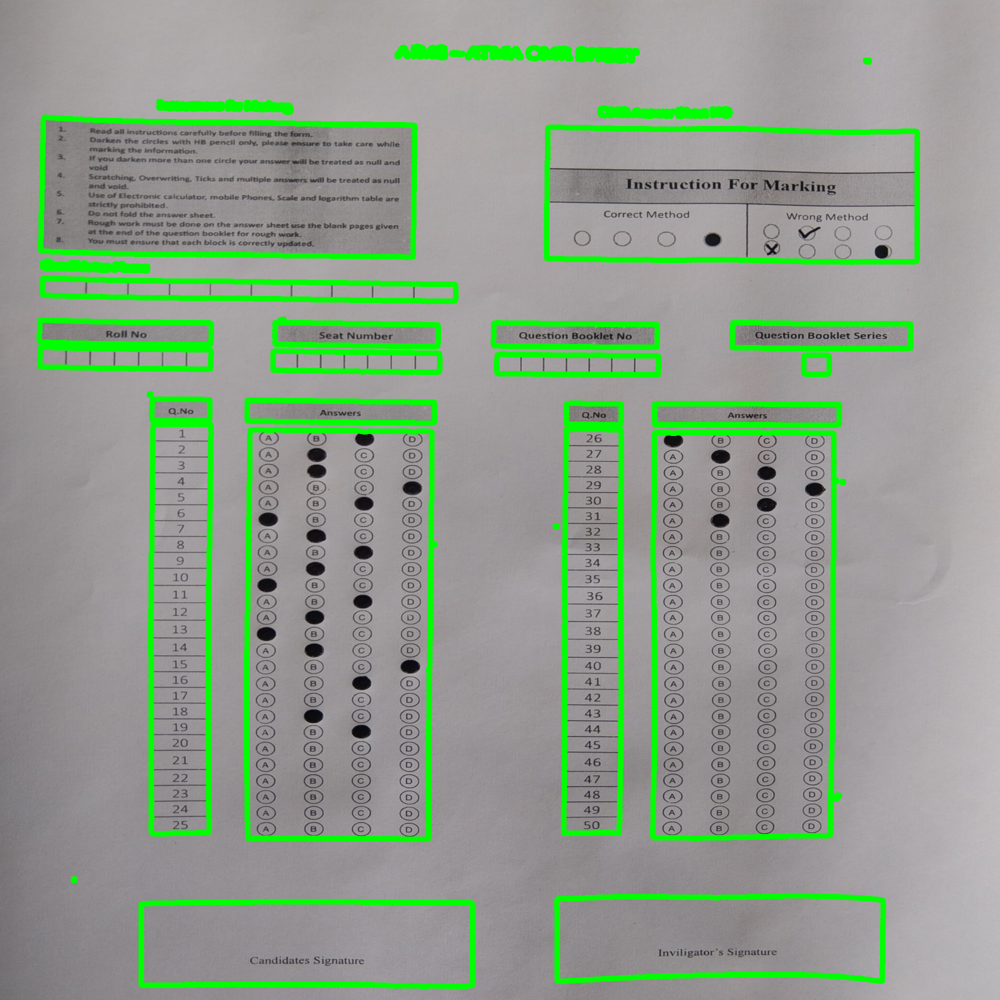

In [ ]:
countours,hierarchy=cv2.findContours(imgCanny,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

imgContours=img.copy()
cv2.drawContours(imgContours,countours,-1,(0,255,0),10 )
cv2_imshow(imgContours)

In [ ]:
def rectCountour(coutours):

  rectCon=[]

  for i in coutours:
    area=cv2.contourArea(i)
    if area>50:
      peri=cv2.arcLength(i,True)
      approx=cv2.approxPolyDP(i,0.02*peri,True)
      if len(approx)==4:
        rectCon.append(i)

  rectCon=sorted(rectCon,key=cv2.contourArea,reverse=True)

  return rectCon



def getCornerPoints(cont):
  peri=cv2.arcLength(cont,True)
  approx=cv2.approxPolyDP(cont,0.02*peri,True)
  return approx


In [ ]:
rectCon=rectCountour(countours)
biggestContour1=getCornerPoints(rectCon[0])
biggestContour2=getCornerPoints(rectCon[1])

print(biggestContour1)


[[[ 502  859]]

 [[ 495 1676]]

 [[ 854 1678]]

 [[ 863  863]]]


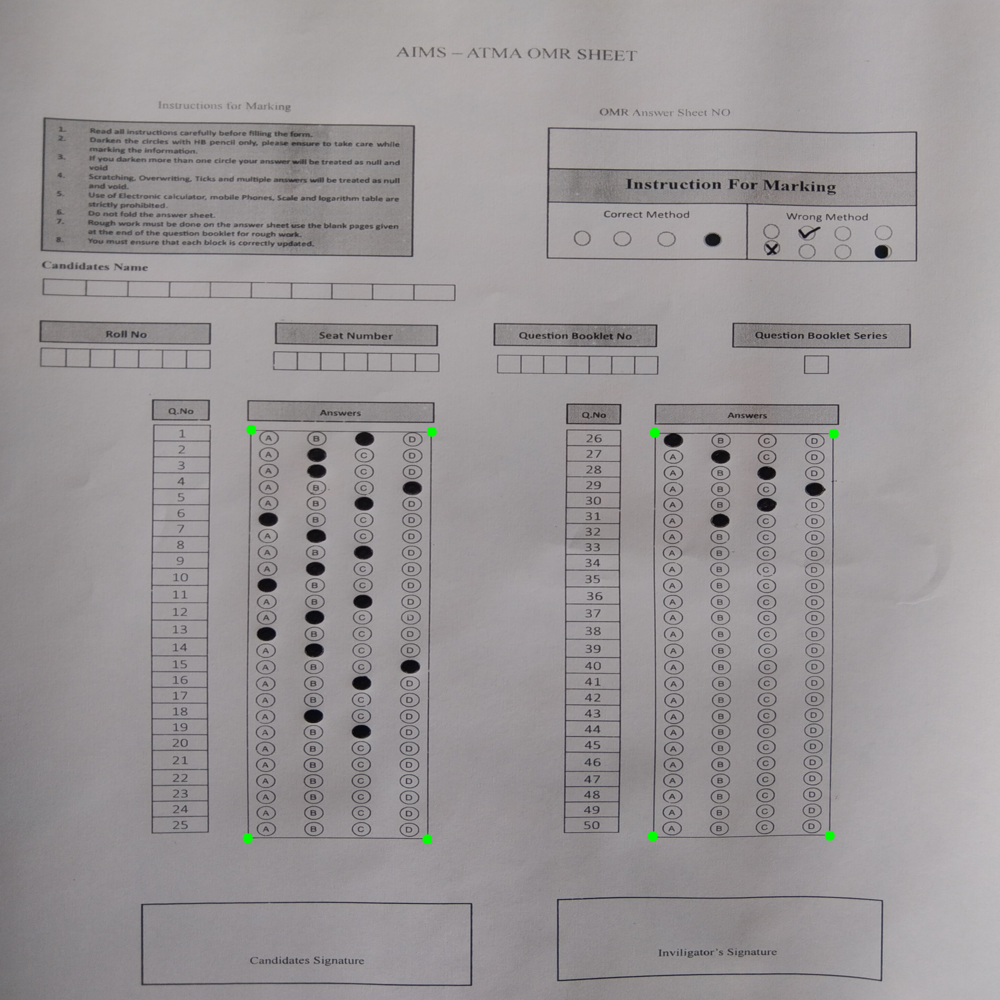

In [ ]:
imgBiggestContours=img.copy()

if biggestContour1.size !=0:
  cv2.drawContours(imgBiggestContours,biggestContour1,-1,(0,255,0),20)

if biggestContour2.size !=0:
  cv2.drawContours(imgBiggestContours,biggestContour2,-1,(0,255,0),20)



cv2_imshow(imgBiggestContours)

In [ ]:
def reorder(myPoints):
  myPoints=myPoints.reshape((4,2))
  myPointsNew=np.zeros((4,1,2),np.int32)
  add=myPoints.sum(1)

  myPointsNew[0]=myPoints[np.argmin(add)]
  myPointsNew[3]=myPoints[np.argmax(add)]

  diff=np.diff(myPoints,axis=1)
  myPointsNew[1]=myPoints[np.argmin(diff)]
  myPointsNew[2]=myPoints[np.argmax(diff)]

  return myPointsNew




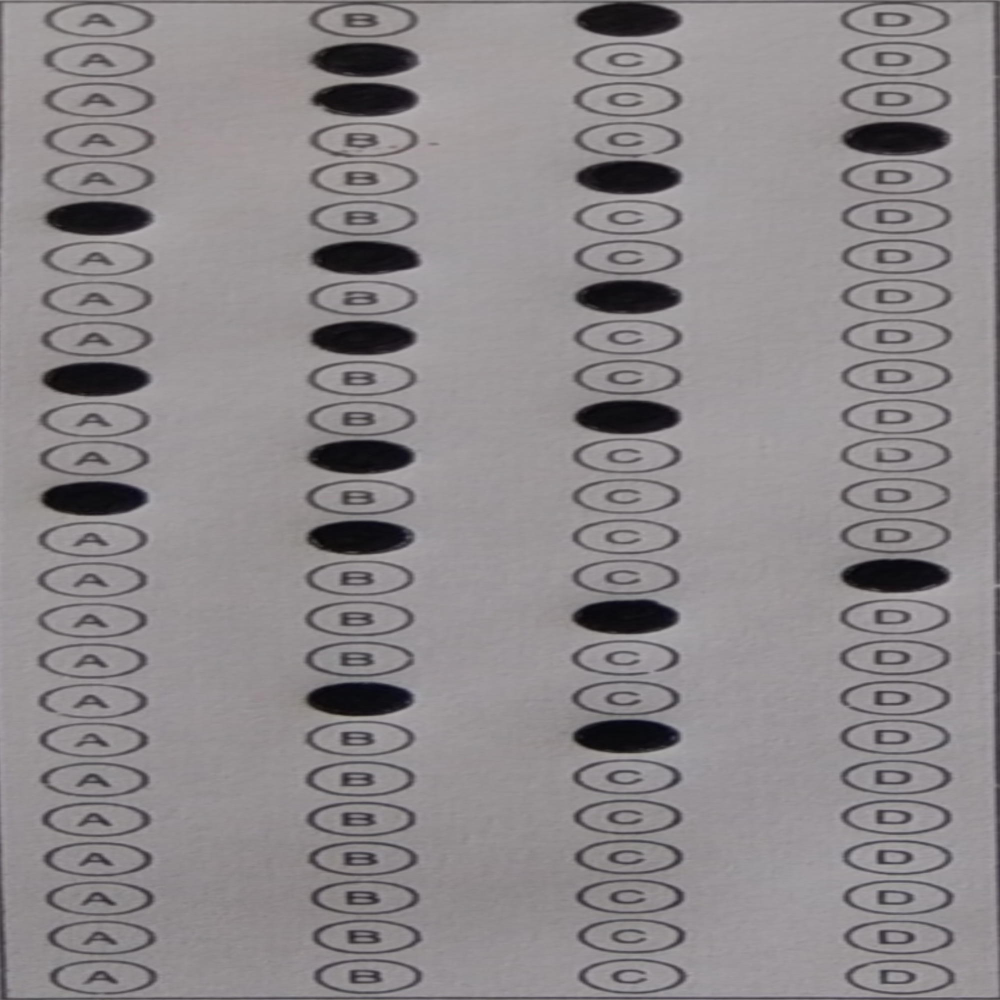

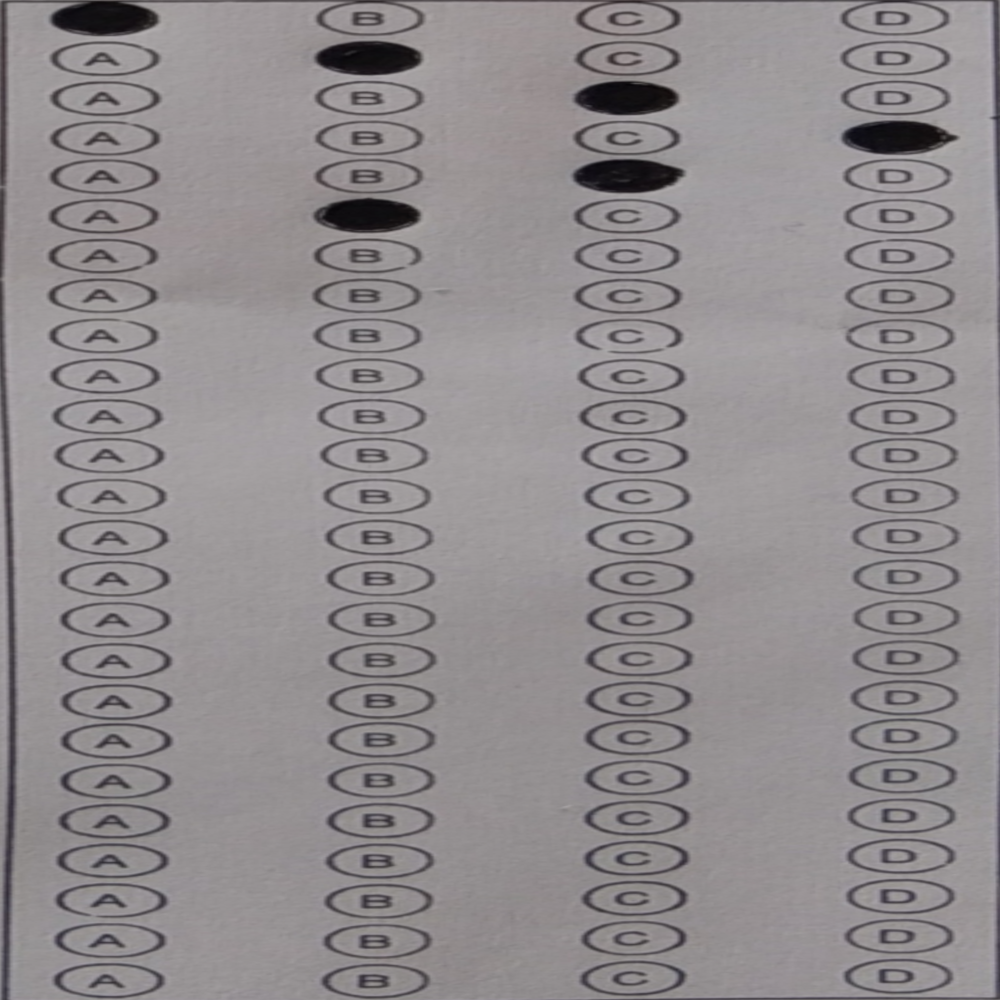

In [ ]:
from numpy.matrixlib.defmatrix import matrix

biggestContour1=reorder(biggestContour1)
biggestContour2=reorder(biggestContour2)


#first box
pt11=np.float32(biggestContour1)

pt12=np.float32([[0,0],[widthImg,0],[0,heightImg],[widthImg,heightImg]])

matrix1=cv2.getPerspectiveTransform(pt11,pt12)

imgWarpColored1=cv2.warpPerspective(img,matrix1,(widthImg,heightImg))

cv2_imshow(imgWarpColored1)


#second box
pt21=np.float32(biggestContour2)

pt22=np.float32([[0,0],[widthImg,0],[0,heightImg],[widthImg,heightImg]])

matrix2=cv2.getPerspectiveTransform(pt21,pt22)

imgWarpColored2=cv2.warpPerspective(img,matrix2,(widthImg,heightImg))

cv2_imshow(imgWarpColored2)


In [ ]:
def splitBoxes(img):
  rows=np.vsplit(img,25)
  boxes=[]
  cv2_imshow(rows[24])
  for r in rows:
    cols=np.hsplit(r,4)

    for box in cols:
      boxes.append(box)

  return boxes



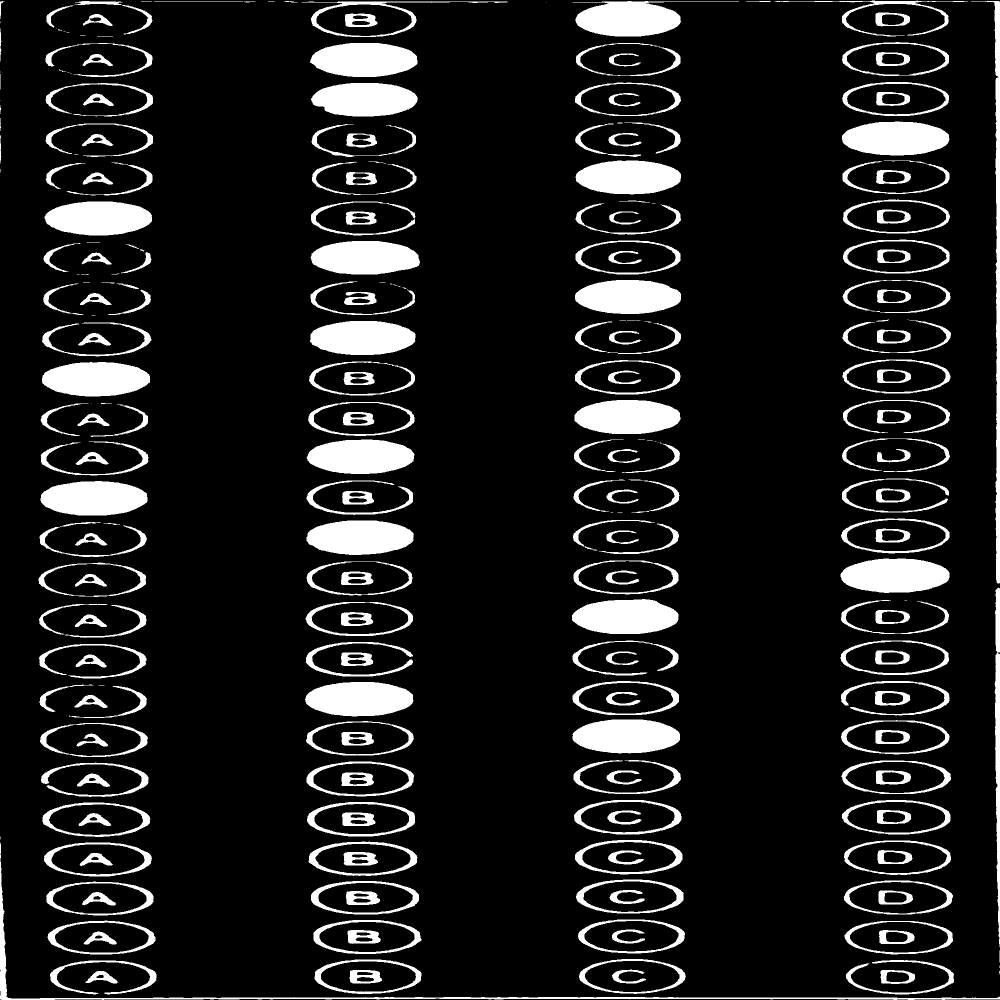

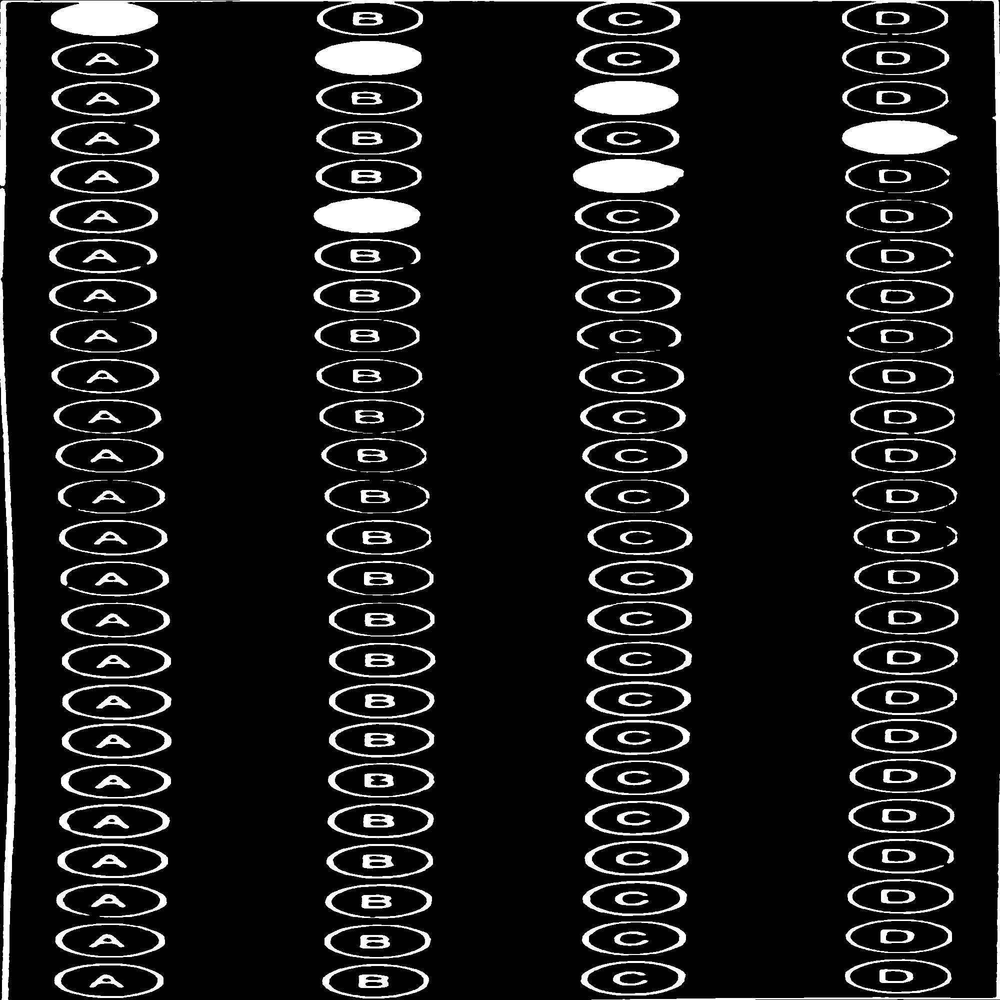

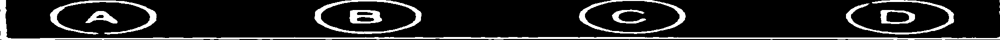

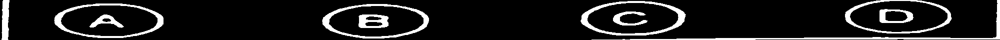

[[ 2508.  4213. 11907.  4307.]
 [ 2285. 11563.  2066.  3518.]
 [ 2579. 11301.  2385.  3665.]
 [ 2454.  2358.  2295. 12212.]
 [ 2298.  2404. 11304.  3332.]
 [11579.  2860.  2020.  3443.]
 [ 1811. 11730.  2671.  3467.]
 [ 2157.  2419. 11429.  3038.]
 [ 2842. 11530.  2180.  3053.]
 [11785.  2801.  2724.  3298.]
 [ 2307.  3153. 11598.  3203.]
 [ 2794. 11708.  2104.  2822.]
 [11766.  3247.  2153.  3391.]
 [ 2437. 11775.  2315.  3779.]
 [ 2472.  2936.  2709. 12249.]
 [ 2614.  3394. 11713.  3248.]
 [ 2885.  3611.  2556.  3819.]
 [ 2493. 11854.  3295.  4022.]
 [ 2751.  3209. 11608.  3878.]
 [ 3169.  3783.  3078.  3981.]
 [ 3364.  4128.  3510.  3861.]
 [ 3653.  4222.  3703.  3579.]
 [ 3802.  4150.  3617.  3441.]
 [ 4070.  4052.  3266.  3291.]
 [ 5811.  5352.  4692.  4804.]]
[[14112.  4618.  4772.  4582.]
 [ 3707. 11531.  3376.  3369.]
 [ 4010.  2889. 11249.  3432.]
 [ 3843.  2916.  3200. 12354.]
 [ 4021.  3317. 11583.  2476.]
 [ 4012. 11429.  2878.  2449.]
 [ 3624.  3071.  2774.  2593.]
 [ 3165

In [ ]:
#Apply the threshHold

imgWarpGray1=cv2.cvtColor(imgWarpColored1,cv2.COLOR_BGR2GRAY)
imgThresh1=cv2.threshold(imgWarpGray1,100,255,cv2.THRESH_BINARY_INV)[1]
cv2_imshow(imgThresh1)

imgWarpGray2=cv2.cvtColor(imgWarpColored2,cv2.COLOR_BGR2GRAY)
imgThresh2=cv2.threshold(imgWarpGray2,100,255,cv2.THRESH_BINARY_INV)[1]
cv2_imshow(imgThresh2)

boxes1=splitBoxes(imgThresh1)
boxes2=splitBoxes(imgThresh2)

myPixelVal1=np.zeros((25,4))
myPixelVal2=np.zeros((25,4))

countC=0
countR=0

for image in boxes1:
  totalPixels=cv2.countNonZero(image)
  myPixelVal1[countR][countC]=totalPixels
  countC+=1
  if (countC==4):countR+=1;countC=0

countC=0
countR=0
for image in boxes2:
  totalPixels=cv2.countNonZero(image)
  myPixelVal2[countR][countC]=totalPixels
  countC+=1
  if (countC==4):countR+=1;countC=0

print(myPixelVal1)
print(myPixelVal2)

In [ ]:
def extract_student_answers(pixel_matrix, threshold=10000):
    num_questions, num_options = pixel_matrix.shape

    # Create an empty list to store the student answers
    student_answers = []

    for i in range(num_questions):
        question_answer = None
        multiple_answers = False

        for j in range(num_options):
            pixel_value = pixel_matrix[i, j]
            if pixel_value > threshold:
                # If a student selected an option
                if question_answer is None:
                    question_answer = j  # Store the option selected
                else:
                    # If a student selected multiple options for the same question
                    question_answer = -1  # Mark as multiple answers
                    multiple_answers = True

        # If none of the options is selected, append -2
        if question_answer is None:
            question_answer = -2

        student_answers.append(question_answer if not multiple_answers else -1)

    return student_answers

In [ ]:
selected_ans1=extract_student_answers(myPixelVal1,10000)
selected_ans2=extract_student_answers(myPixelVal2,10000)

print(selected_ans1)
print(selected_ans2)

[2, 1, 1, 3, 2, 0, 1, 2, 1, 0, 2, 1, 0, 1, 3, 2, -2, 1, 2, -2, -2, -2, -2, -2, -2]
[0, 1, 2, 3, 2, 1, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2]


In [ ]:
correct_ans1=[3,2,2,4,3,1,2,3,2,1,3,2,1,2,4,3,3,2,3,3,2,3,3,2,3]
correct_ans2=[1,2,3,4,3,2,3,2,3,2,3,3,2,3,3,2,3,3,4,2,3,2,4,2,3]

correct=0
wrong=0
Not_Answerd=0

for i in range(0,25):
  if(selected_ans1[i]==-1):
    wrong+=1
  elif selected_ans1[i]==-2:
    Not_Answerd+=1
  elif selected_ans1[i]+1==correct_ans1[i]:
    correct+=1
  else:
    wrong+=1



for i in range(0,25):
  if(selected_ans2[i]==-1):
    wrong+=1
  elif selected_ans2[i]==-2:
    Not_Answerd+=1
  elif selected_ans2[i]+1==correct_ans2[i]:
    correct+=1
  else:
    wrong+=1

In [ ]:
print("correct:---",correct)
print("wrong:---",wrong)
print("Not_Answerd:---",Not_Answerd)

correct:--- 24
wrong:--- 0
Not_Answerd:--- 26
